In [1]:
import os
import json
import time
import copy
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
import random
from torch.utils.data import Dataset
from torchvision import transforms
import torchvision
import torch
import numpy as np
from tqdm.notebook import tqdm
from collections import defaultdict
from sklearn.metrics import roc_curve, auc
import warnings
warnings.filterwarnings('ignore')

In [2]:
torch.cuda.is_available()

True

In [3]:
dataset_folder = "./../../datasets/ball_pythons/"

In [4]:
main_folder_list = os.listdir(dataset_folder)
morph_folder_list = [f"{dataset_folder}{i}/" for i in main_folder_list if "%" not in i and "." not in i and "Pos" not in i]

In [5]:
morph_img_folder_dict = {}
for morph_folder in morph_folder_list:
    morph_img_folder_list = os.listdir(morph_folder)
    morph_img_folder_list = [f"{morph_folder}{i}/" for i in morph_img_folder_list]
    if len(morph_img_folder_list) > 50:
        morph_img_folder_dict[morph_folder.split("/")[-2]] = {"img_folders": morph_img_folder_list,
        "num_imgs": len(morph_img_folder_list)}

In [6]:
%matplotlib inline
total = 0
json_paths_list = []
for morph, morph_dict in morph_img_folder_dict.items():
    img_folder_list = morph_dict["img_folders"]
    image_paths = [[i+k for k in os.listdir(i) if k.endswith(".png")][0] for i in img_folder_list]
    json_paths = [[i+k for k in os.listdir(i) if k.endswith(".json")][0] for i in img_folder_list]
    json_paths_list.extend(json_paths)
    rand_samples = random.sample(image_paths,2)
    # fig, ax = plt.subplots(ncols=2, figsize=(18,9))
    # image = Image.open(rand_samples[0])
    # ax[0].imshow(image)
    # image = Image.open(rand_samples[1])
    # ax[1].imshow(image)
    # fig.suptitle(f"{morph} - 2/{morph_dict['num_imgs']}", fontsize=20)
    total += morph_dict["num_imgs"]
print(f"total imgs in dict: {total} - {len(morph_img_folder_dict)} morphs")

total imgs in dict: 11277 - 15 morphs


In [7]:
morph_details_dict = {}
all_image_details_dict = {}
for path in tqdm(json_paths_list):
    image_details_dict = {}
    cur_morph = path.split("/")[-3]
    if not morph_details_dict.get(cur_morph):
        morph_details_dict[cur_morph] = {}
    with open(path, "r") as f:
        image_details_dict = json.load(f)
        del image_details_dict["raw_details"]
    early_path = "/".join(path.split("/")[:-1])
    image_path = [f"{early_path}/{i}" for i in os.listdir(early_path) if not i.endswith(".json")][0]
    try:
        image = Image.open(image_path)
        image_details_dict["width"] = image.width
        image_details_dict["height"] = image.height
    except Exception as e:
        image_details_dict = {}
    if image_details_dict:
        morph_details_dict[cur_morph][image_path] = image_details_dict
        all_image_details_dict[image_path] = image_details_dict

  0%|          | 0/11277 [00:00<?, ?it/s]

In [8]:
metadata_df = pd.DataFrame.from_dict(all_image_details_dict, orient="index")
metadata_df = metadata_df.reset_index()
metadata_df = metadata_df.rename(columns={"index":"image_path"})

In [9]:
metadata_df.head()

,image_path,sex,traits,weight,price,width,height,dob,proven_breeder
0,./../../datasets/ball_pythons/Fire/Fire_bb1b7d...,female,[Fire],200g,US$125.00,550,540,NaN,NaN
1,./../../datasets/ball_pythons/Fire/Fire_fa9ffb...,male,[Fire],760g,US$100.00,412,550,2019,NaN
2,./../../datasets/ball_pythons/Fire/Fire_6703a0...,female,[Fire],1900g,US$500.00,412,550,July 2019,Yes
3,./../../datasets/ball_pythons/Fire/Fire_bf00f4...,female,[Fire],1644g,US$375.00,440,550,2016,Yes
4,./../../datasets/ball_pythons/Fire/Fire_b1ca68...,female,[Fire],NaN,US$85.00,550,413,2021,NaN


In [10]:
metadata_df.to_csv("./../../datasets/ball_pythons/dataset_metadata.csv", index=False)

In [11]:
test_df = pd.read_csv("./../../datasets/ball_pythons/dataset_metadata.csv")
test_df.head()

,image_path,sex,traits,weight,price,width,height,dob,proven_breeder
0,./../../datasets/ball_pythons/Fire/Fire_bb1b7d...,female,['Fire'],200g,US$125.00,550,540,NaN,NaN
1,./../../datasets/ball_pythons/Fire/Fire_fa9ffb...,male,['Fire'],760g,US$100.00,412,550,2019,NaN
2,./../../datasets/ball_pythons/Fire/Fire_6703a0...,female,['Fire'],1900g,US$500.00,412,550,July 2019,Yes
3,./../../datasets/ball_pythons/Fire/Fire_bf00f4...,female,['Fire'],1644g,US$375.00,440,550,2016,Yes
4,./../../datasets/ball_pythons/Fire/Fire_b1ca68...,female,['Fire'],NaN,US$85.00,550,413,2021,NaN


In [12]:
print(f"width - min: {metadata_df.width.min()} - median: {metadata_df.width.median()} - max: {metadata_df.width.max()}")
print(f"height - min: {metadata_df.height.min()} - median: {metadata_df.height.median()} - max: {metadata_df.height.max()}")

width - min: 155 - median: 550.0 - max: 550
height - min: 158 - median: 452.0 - max: 550


In [13]:
trait_list = []
for trait in metadata_df.traits.to_list():
    trait_list.extend(trait)

In [14]:
traits_dict = defaultdict(lambda: 0)
for trait in trait_list:
    traits_dict[trait] += 1

In [16]:
traits_dict = {k: v for k, v in sorted(traits_dict.items(), key=lambda item: item[1])}
traits_dict

{'Monarch': 1,
 '50% Het Moray': 1,
 'Smoke': 1,
 'Ajax': 1,
 'Alloy': 1,
 'Citron': 1,
 'Super Calico': 1,
 'Zuwadi': 1,
 '66% Het Monsoon': 1,
 'Mosaic': 1,
 '66% Het Orange Ghost': 1,
 'Black Belly': 1,
 'Super Phantom': 1,
 'Pos Het Caramel Albino': 1,
 'Super Bamboo': 1,
 'Super Spark': 1,
 '100% Het Axanthic (MJ)': 1,
 'Melt': 1,
 'Bling Yellow Belly': 1,
 'Super Nr Mandarin': 1,
 'Arcane': 1,
 'Axanthic (MJ)': 1,
 'Pos Het Moray': 1,
 'Marvel': 1,
 'Super Bongo': 1,
 'Satin': 1,
 'Super X-treme Gene': 1,
 '100% Het Axanthic (GCR)': 1,
 'KRG': 1,
 'Pastel Jungle': 1,
 'Jolt': 1,
 'Nyala': 1,
 'Cafe': 1,
 'Desert': 1,
 '100% Het Ghost (Vesper)': 1,
 'Super Scaleless Head': 1,
 '100% Het Green Ghost': 1,
 'Java': 1,
 'Paint': 1,
 'Super Cypress': 1,
 'Super Disco': 1,
 'Flare': 1,
 'Super Sapphire': 1,
 'Super Black': 1,
 'Lori': 1,
 'Super Asphalt': 2,
 'Super Sandblast': 2,
 '50% Het Monsoon': 2,
 'Pos Het Ghost (Vesper)': 2,
 '66% Het Tri-stripe': 2,
 'Super Red Stripe': 2,
 'Hy

In [15]:
filtered_traits = []
for trait, num in traits_dict.items():
    if '%' in trait and "100" not in trait:
        continue
    elif num >= 20:
        filtered_traits.append(trait)

In [17]:
filtered_traits[0:5]

['Fire', 'Albino', 'Normal', 'Cinnamon', 'Mojave']

In [18]:
class SquareCrop(object):
    def __init__(self):
        pass

    def __call__(self, tensor):
        longer_side = min(tensor.size)
        horizontal_padding = (longer_side - tensor.size[0]) / 2
        vertical_padding = (longer_side - tensor.size[1]) / 2
        cropped_tensor = tensor.crop((-horizontal_padding,
                        -vertical_padding,
                        tensor.size[0] + horizontal_padding,
                        tensor.size[1] + vertical_padding
                ))
        return cropped_tensor
    
    def __repr__(self):
        return self.__class__.__name__+'()'

In [19]:
def get_split(sample_array, split):
    np.random.seed(0)
    np.random.shuffle(sample_array)
    np.random.seed()
    if split == 'train':
        sample_array = sample_array[:int(len(sample_array)*0.7)]
    elif split == 'val':
        sample_array = sample_array[int(len(sample_array)*0.7):int(len(sample_array)*0.85)]
    elif split == 'test':
        sample_array = sample_array[int(len(sample_array)*0.85):]
    return list(sample_array)

In [20]:
def count_number_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

In [21]:
unique_traits = list(set(filtered_traits))
unique_traits.sort()
col_names = ["image_path"]
col_names.extend(unique_traits)
label_df = pd.DataFrame(columns=col_names)
# label_df = label_df.set_index("image_path")
unique_traits[0:10]

['100% Het Albino',
 '100% Het Axanthic (TSK)',
 '100% Het Axanthic (VPI)',
 '100% Het Candy',
 '100% Het Clown',
 '100% Het Cryptic',
 '100% Het Desert Ghost',
 '100% Het Genetic Stripe',
 '100% Het Hypo',
 '100% Het Lavender Albino']

In [22]:
label_df.head()

,image_path,100% Het Albino,100% Het Axanthic (TSK),100% Het Axanthic (VPI),100% Het Candy,100% Het Clown,100% Het Cryptic,100% Het Desert Ghost,100% Het Genetic Stripe,100% Het Hypo,...,Super Mojave,Super Orange Dream,Super Pastel,Super Yellow Belly,Trick,Ultramel,Vanilla,Woma,Wookie,Yellow Belly


In [23]:
# for ind, row in tqdm(metadata_df.iterrows(), total=len(metadata_df)):
#     label_row = [row['image_path']]
#     label_row.extend([1 if i in row['traits'] else 0 for i in unique_traits])
#     label_df.loc[len(label_df.index)] = label_row
# label_df.to_csv("./../../datasets/ball_pythons/label_data_filt_15_no_poss.csv", index=False)
label_df = pd.read_csv("./../../datasets/ball_pythons/label_data_filt_15_no_poss.csv")

In [24]:
label_df.sample(5)

,image_path,100% Het Hypo,Female Maker,Cinnamon,Special,100% Het Clown,Gravel,Sandblast,100% Het Puzzle,Red Stripe,...,Super Yellow Belly,Spotnose,Axanthic (TSK),100% Het Ultramel,Calico,Pastel,Super Banana,Trick,Orange Dream,Super Pastel
2770,./../../datasets/ball_pythons/combo/combo_6161...,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2292,./../../datasets/ball_pythons/combo/combo_182b...,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
8672,./../../datasets/ball_pythons/combo/combo_546d...,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
2973,./../../datasets/ball_pythons/combo/combo_64f1...,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1270,./../../datasets/ball_pythons/Super Mojave/Sup...,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [25]:
class BallPythonDataset(Dataset):
    ##### Initialize the class #####
    def __init__(self, dataset_df, possible_traits, split = 'train'):
        ## Split parameter is used to specify which process the data is used for,
        ## and it can be 'train', 'val', and 'test
        self.set_of_finding_labels = possible_traits
        
        ## Get the list of all patient ids present in the dataset and split into
        ## training, validation and testing by patient id, but not by list of examples
        image_paths = pd.unique(dataset_df.index)
        selected_paths = get_split(image_paths, split)

        sample_df = dataset_df.loc[selected_paths]      
        
        sample_df = sample_df[["image_path"] + self.set_of_finding_labels]

        self.image_list = sample_df['image_path'].values
        self.targets = sample_df[self.set_of_finding_labels].values
        
        ## Define data augmentation transformations for the input images. In this exercise, we use the following
        ## transformations: square center cropping, resizing to 224x224 (to be similar as ImageNet dataset), 
        ## converting to tensor, normalizing per channel (i.e., R, G, and B) 
        ## with the average and standard deviation of images in the ImageNet dataset 
        if split != "train":       
            self.set_of_transforms = transforms.Compose(
            [SquareCrop(),
            transforms.Resize(228),
            transforms.ToTensor(), 
            transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225)),
            transforms.Resize(224)])
        else:
            self.set_of_transforms = transforms.Compose(
            [transforms.RandomAffine(degrees = 180, 
                                     translate = (0.1, 0.1), 
                                     scale= (0.9, 1.1), 
                                     shear = 5,
                                     ),
            SquareCrop(),
            transforms.Resize(228),
            transforms.ToTensor(), 
            transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225)),
            transforms.Resize(224)])
        
    ##### Retrieve a sample with the corresponding index #####
    ## This function retrieve a sample from the dataset at the specified index 
    ## and returns an image and the corresponding label stored in Pytorch tensors     
    def __getitem__(self, index):
        curr_pil_image = Image.open(self.image_list[index])
        image_to_return = self.set_of_transforms(curr_pil_image)
                
        return image_to_return, torch.FloatTensor(self.targets[index])
    
    ##### Get the length of the dataset #####tm
    def __len__(self):
        return len(self.image_list)
    
    ##### Access the name of conditions in the labels #####
    def get_labels_name(self):
        return self.set_of_finding_labels

In [26]:
train_dataset = BallPythonDataset(label_df, unique_traits)
val_dataset = BallPythonDataset(label_df, unique_traits, split = 'val')
test_dataset = BallPythonDataset(label_df, unique_traits, split = 'test')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

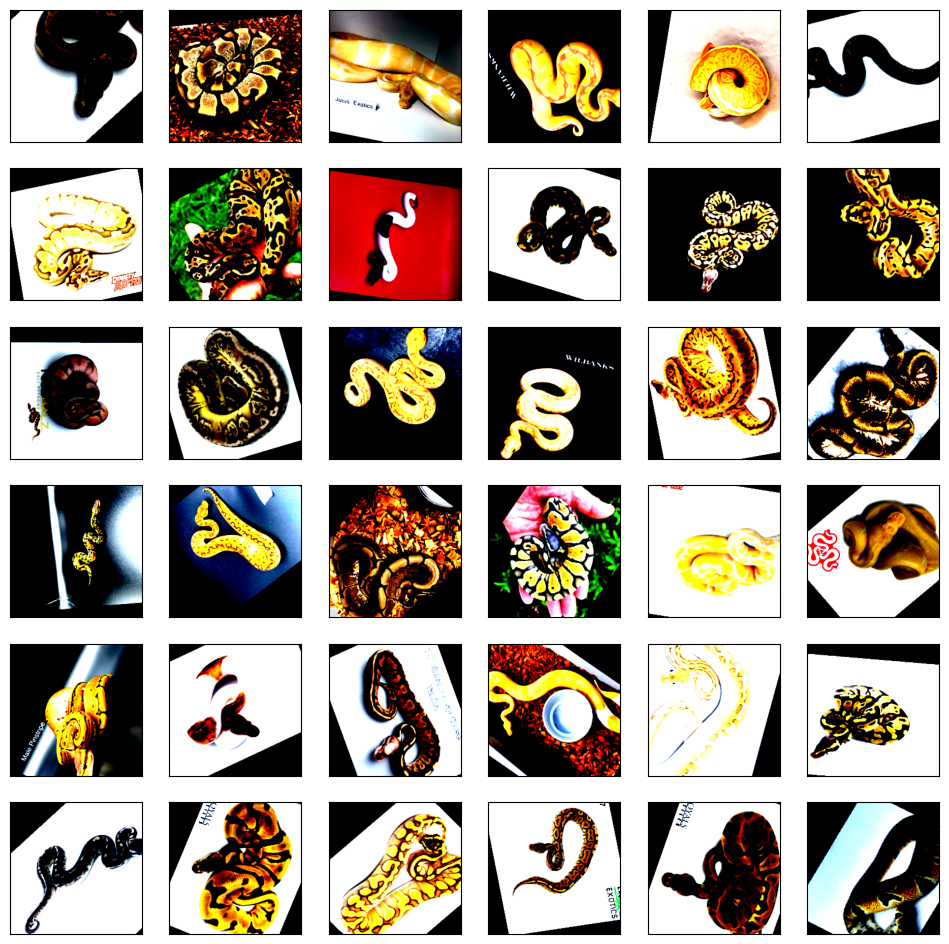

In [27]:
fig, ax = plt.subplots(ncols = 6, nrows = 6, figsize=(12,12))
j = 0
for i in range(36):
    k = i % 6
    img, targ = train_dataset[i]
    ax[j,k].imshow(img.permute(1,2,0).detach())
    ax[j,k].set_xticks([])
    ax[j,k].set_yticks([])
    if k == 5:
        j += 1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

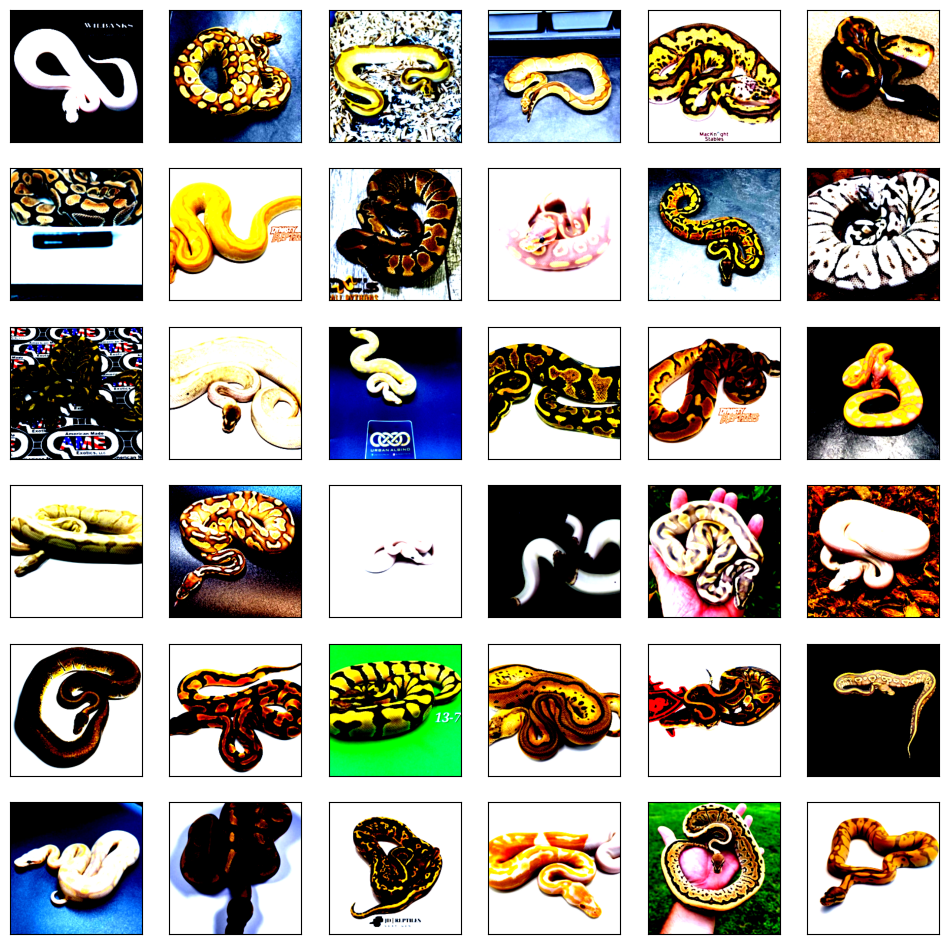

In [28]:
fig, ax = plt.subplots(ncols = 6, nrows = 6, figsize=(12,12))
j = 0
for i, rand_ind in enumerate(random.sample(list(range(len(test_dataset))), 36)):
    k = i % 6
    img, targ = val_dataset[rand_ind]
    ax[j,k].imshow(img.permute(1,2,0).detach())
    ax[j,k].set_xticks([])
    ax[j,k].set_yticks([])
    if k == 5:
        j += 1

In [29]:
trait_freq = np.sum(train_dataset.targets, axis=0)/len((train_dataset))
for i, trait_name in enumerate(unique_traits):
    print(f"{trait_name} - {round(trait_freq[i]*100, 4)}%")

100% Het Albino - 2.9434%
100% Het Axanthic (TSK) - 2.474%
100% Het Axanthic (VPI) - 3.4509%
100% Het Candy - 1.256%
100% Het Clown - 11.4438%
100% Het Cryptic - 0.3299%
100% Het Desert Ghost - 4.6435%
100% Het Genetic Stripe - 0.7232%
100% Het Hypo - 4.9607%
100% Het Lavender Albino - 0.9262%
100% Het Orange Ghost - 0.2411%
100% Het Piebald - 6.8891%
100% Het Puzzle - 0.609%
100% Het Tri-stripe - 0.2411%
100% Het Ultramel - 0.7612%
Acid - 1.8777%
Albino - 3.73%
Asphalt - 0.7232%
Axanthic (TSK) - 1.421%
Axanthic (VPI) - 3.0322%
Bamboo - 5.8741%
Banana - 12.7379%
Black Head - 1.7508%
Black Pastel - 6.6861%
Blade - 0.3806%
Bongo - 0.406%
Butter - 6.61%
Calico - 1.3702%
Champagne - 1.3068%
Chocolate - 1.2307%
Cinnamon - 6.8384%
Clown - 7.9295%
Confusion - 0.5202%
Coral Glow - 5.9249%
Cypress - 0.7866%
Desert Ghost - 1.256%
Disco - 0.2157%
Enchi - 11.4311%
Fader - 0.1269%
Female Maker - 0.1776%
Fire - 8.8176%
GHI - 6.7496%
Genetic Stripe - 0.812%
Granite - 0.2791%
Gravel - 0.6597%
Het Red 

In [30]:
##### Calculate AUC metric #####
## This function compute AUC from the given input arrays i.e., predicted value and ground truth arrays
def auroc(logits_predicted, target):
    fpr, tpr, _ = roc_curve(target, logits_predicted)
    return auc(fpr, tpr)

##### Compute AUC of a given dataset #####
## This function takes a model and Pytorch data loader as input. 
## The given model is used to predict the expected label for each sample in the Pytorch data loader.
def get_score_model_auroc(model, data_loader):
    ## Toggle model to eval mode
    model.eval()
    
    ## Iterate through the dataset and perform inference for each sample.
    ## Store inference results and target labels for AUC computation 
    with torch.no_grad():
        
        logits_predicted = np.zeros([1, len(unique_traits)])
        targets = np.zeros([1, len(unique_traits)])
        ## Iterate through the dataset and perform inference for each sample.
        ## Store inference results and target labels for AUC computation  
        for image, target in data_loader:
            image = image.cuda()
            # image = image.unsqueeze(0)
            logit_predicted = model(image)
            logits_predicted = np.concatenate((logits_predicted, logit_predicted.cpu().detach().numpy())\
                                              , axis = 0)
            # target = target.unsqueeze(0)
            targets = np.concatenate((targets, target.cpu().detach().numpy()), axis = 0)
            
    ## Return a list of auc values in which each value corresponds to one of the traits
    return [auroc(logits_predicted[:,i], targets[:,i]) for i in range(len(unique_traits))]

In [31]:
train_dataset = BallPythonDataset(label_df, unique_traits, 'train')
val_dataset = BallPythonDataset(label_df, unique_traits, 'val')
test_dataset = BallPythonDataset(label_df, unique_traits, 'test')

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=18, num_workers=12)
val_loader = torch.utils.data.DataLoader(val_dataset, batch_size=18, num_workers=12)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=18, num_workers=12)

In [32]:
# loss function - multilabel soft margin loss - images can have multiple correct labels and is similar to log-softmax
multi_label_loss = torch.nn.MultiLabelSoftMarginLoss()

In [33]:
def average_auc(trait_aucs: list):
    """
    Because bad labels some NaNs and those need to be ignored
    """
    total_auc = real_labels = 0
    for trait_auc in trait_aucs:
        if not np.isnan(trait_auc):
            total_auc += trait_auc
            real_labels += 1
    
    return total_auc/real_labels


20 epochs at Learning Rate = 0.001 


Ep 0: Train Loss = 0.09906; Train Acc = 0.78382
Val Acc = 0.76553
Epoch 0 - time 212.2
Ep 1: Train Loss = 0.08369; Train Acc = 0.82064
Val Acc = 0.79968
Epoch 1 - time 180.6
Ep 2: Train Loss = 0.07880; Train Acc = 0.84561
Val Acc = 0.81204
Epoch 2 - time 187.9
Ep 3: Train Loss = 0.07529; Train Acc = 0.86355
Val Acc = 0.82081
Epoch 3 - time 191.8
Ep 4: Train Loss = 0.07267; Train Acc = 0.87797
Val Acc = 0.83281
Epoch 4 - time 197.4
Ep 5: Train Loss = 0.07023; Train Acc = 0.88747
Val Acc = 0.84275
Epoch 5 - time 184.4
Ep 6: Train Loss = 0.06781; Train Acc = 0.90429
Val Acc = 0.84917
Epoch 6 - time 184.7
Ep 7: Train Loss = 0.06575; Train Acc = 0.90914
Val Acc = 0.85178
Epoch 7 - time 194.1
Ep 8: Train Loss = 0.06342; Train Acc = 0.91470
Val Acc = 0.85706
Epoch 8 - time 192.0
Ep 9: Train Loss = 0.06093; Train Acc = 0.92474
Val Acc = 0.85640
Epoch 9 - time 179.6
Ep 10: Train Loss = 0.05914; Train Acc = 0.92611
Val Acc = 0.85634
Epoch 10 - time 173.0
Ep

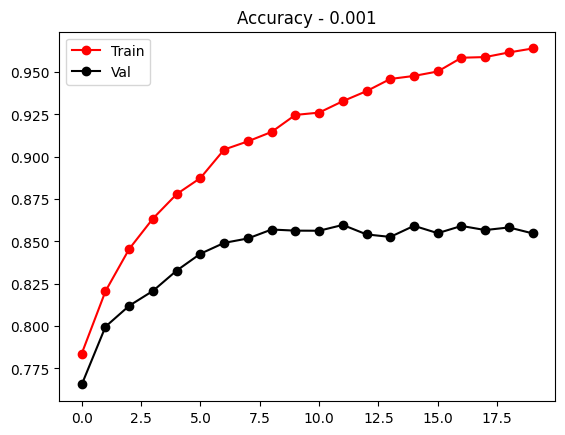

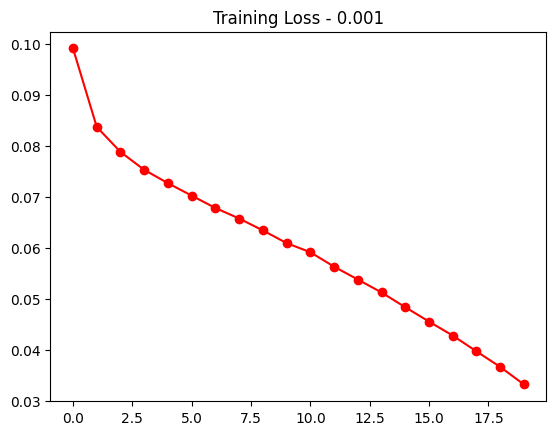

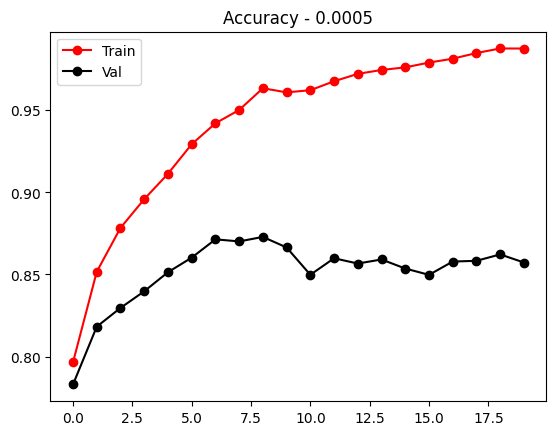

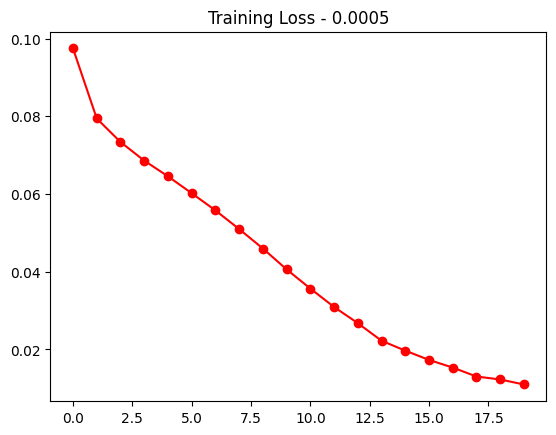

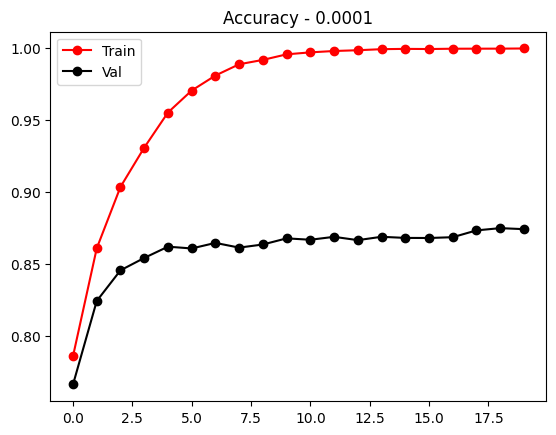

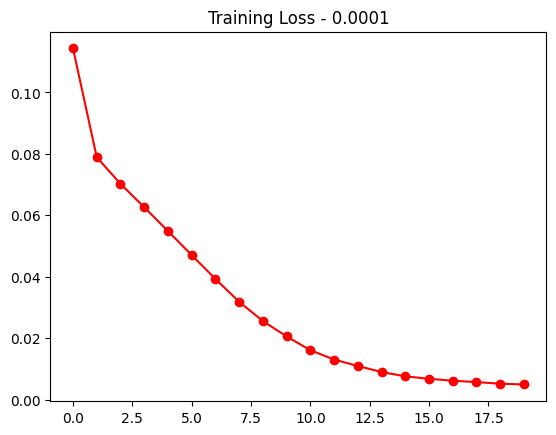

In [34]:
torch.cuda.empty_cache()
total_start = time.time()

train_loss_list = []
train_accuracy_list = []
val_accuracy_list = []
best_accuracy2 = 0.5
best_efficientnetV2M_finetune_list= []

for learn_rate in [0.001, 0.0005, 0.0001]:
    total_start = time.time()
    efficientnetV2M_default_weights = torchvision.models.EfficientNet_V2_M_Weights.DEFAULT
    efficientnetV2M_pretrain = torchvision.models.efficientnet_v2_m(weights=efficientnetV2M_default_weights, progress=False)
    efficientnetV2M_finetune = efficientnetV2M_pretrain
    num_ftrs = efficientnetV2M_finetune.classifier[1].in_features
    efficientnetV2M_finetune.classifier = torch.nn.Linear(num_ftrs, len(unique_traits))
    efficientnetV2M_finetune = efficientnetV2M_finetune.cuda()

    train_loss_list = []
    train_accuracy_list = []
    val_accuracy_list = []
    # best_accuracy2 = 0.5
    best_efficientnetV2M_finetune_list= []

    optim2 = torch.optim.Adam(efficientnetV2M_finetune.parameters(),lr = learn_rate)
    epochs = 20
    print(f"\n{epochs} epochs at Learning Rate =", learn_rate,"\n\n")
    for epoch in range(epochs):
        epoch_start = time.time()
        running_loss = 0.0
        efficientnetV2M_finetune.train()
        for imgs, labels in train_loader:
            imgs = imgs.cuda()
            labels = labels.cuda()
            optim2.zero_grad()
            with torch.set_grad_enabled(True):
                outputs = efficientnetV2M_finetune(imgs)
                loss = multi_label_loss(outputs,labels)
                loss.backward()
                optim2.step()
            running_loss += (loss.item()*imgs.size(0))
        curr_ep_loss2 = running_loss/len(train_loader.dataset)
        curr_train_aucs = get_score_model_auroc(efficientnetV2M_finetune, train_loader)
        curr_train_accuracy2 = average_auc(curr_train_aucs)
        curr_val_aucs = get_score_model_auroc(efficientnetV2M_finetune, val_loader)
        curr_val_accuracy2 = average_auc(curr_val_aucs)
        print('Ep {:d}: Train Loss = {:.5f}; Train Acc = {:.5f}'.format(epoch,curr_ep_loss2,curr_train_accuracy2))
        print('Val Acc = {:.5f}'.format(curr_val_accuracy2))
        train_loss_list.append(curr_ep_loss2)
        train_accuracy_list.append(curr_train_accuracy2)
        val_accuracy_list.append(curr_val_accuracy2)

        if curr_val_accuracy2 > best_accuracy2:
                best_accuracy2 = curr_val_accuracy2
                best_efficientnetV2M_finetune = copy.deepcopy(efficientnetV2M_finetune)
                torch.save(best_efficientnetV2M_finetune,f'./best_aug_efficientnetV2M_finetune2_{learn_rate}.pt')
        epoch_time = time.time()-epoch_start
        print('Epoch {:d} - time {:.1f}'.format(epoch,epoch_time))

    # best_resnet18_finetune = best_resnet18_finetune_list[-1]
    total_time = time.time()-total_start
    print('total training time {:.1f}'.format(total_time))

    plt.figure()
    plt.plot(train_accuracy_list,'ro-',val_accuracy_list,'ko-')
    plt.legend(['Train','Val'])
    plt.title(f'Accuracy - {learn_rate}')

    plt.figure()
    plt.plot(train_loss_list,'ro-')
    plt.title(f'Training Loss - {learn_rate}')


20 epochs at Learning Rate = 0.001 


Ep 0: Train Loss = 0.09463; Train Acc = 0.81850
Val Acc = 0.79153
Epoch 0 - time 60.2
Ep 1: Train Loss = 0.07893; Train Acc = 0.86274
Val Acc = 0.82116
Epoch 1 - time 57.3
Ep 2: Train Loss = 0.07340; Train Acc = 0.88014
Val Acc = 0.83096
Epoch 2 - time 57.8
Ep 3: Train Loss = 0.06912; Train Acc = 0.90739
Val Acc = 0.83717
Epoch 3 - time 57.5
Ep 4: Train Loss = 0.06510; Train Acc = 0.91804
Val Acc = 0.84371
Epoch 4 - time 57.9
Ep 5: Train Loss = 0.06119; Train Acc = 0.93269
Val Acc = 0.85222
Epoch 5 - time 59.5
Ep 6: Train Loss = 0.05703; Train Acc = 0.93864
Val Acc = 0.84779
Epoch 6 - time 58.9
Ep 7: Train Loss = 0.05276; Train Acc = 0.93866
Val Acc = 0.83765
Epoch 7 - time 60.3
Ep 8: Train Loss = 0.04788; Train Acc = 0.93928
Val Acc = 0.84268
Epoch 8 - time 57.3
Ep 9: Train Loss = 0.04331; Train Acc = 0.95268
Val Acc = 0.84295
Epoch 9 - time 57.2
Ep 10: Train Loss = 0.03834; Train Acc = 0.95667
Val Acc = 0.84385
Epoch 10 - time 57.5
Ep 11: Train 

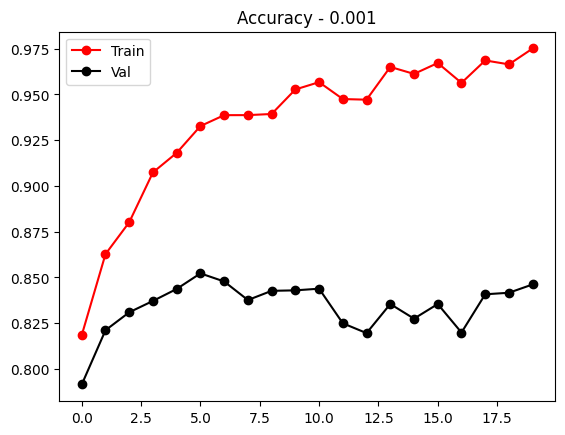

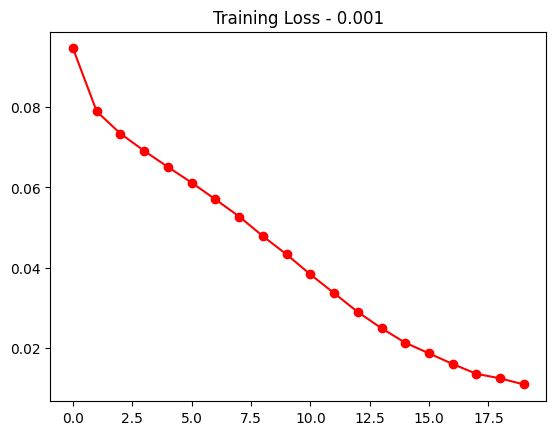

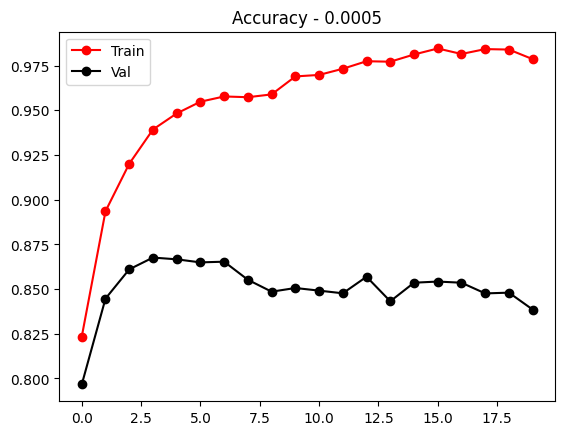

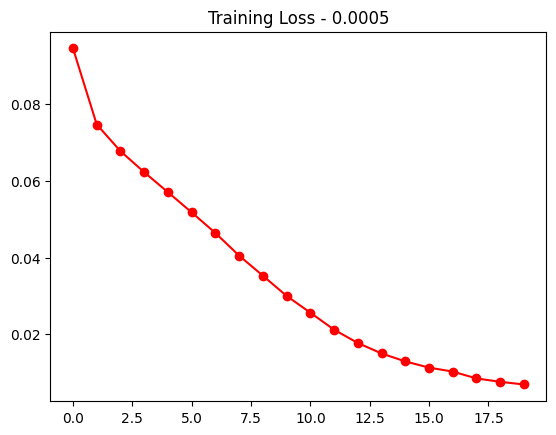

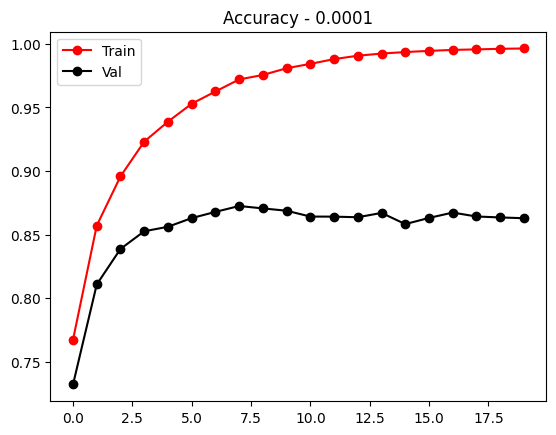

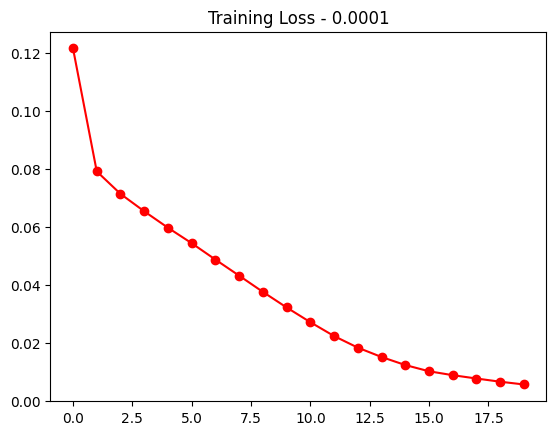

In [35]:
torch.cuda.empty_cache()
total_start = time.time()

train_loss_list = []
train_accuracy_list = []
val_accuracy_list = []
best_accuracy2 = 0.5
best_resnet50_finetune_list= []

for learn_rate in [0.001, 0.0005, 0.0001]:
    total_start = time.time()
    resnet50_default_weights = torchvision.models.ResNet50_Weights.DEFAULT
    resnet50_pretrain = torchvision.models.resnet50(weights=resnet50_default_weights, progress=False)
    resnet50_finetune = resnet50_pretrain
    num_ftrs = resnet50_finetune.fc.in_features
    resnet50_finetune.fc = torch.nn.Linear(num_ftrs, len(unique_traits))
    resnet50_finetune = resnet50_finetune.cuda()

    train_loss_list = []
    train_accuracy_list = []
    val_accuracy_list = []
    # best_accuracy2 = 0.5
    best_resnet50_finetune_list= []

    optim2 = torch.optim.Adam(resnet50_finetune.parameters(),lr = learn_rate)
    epochs = 20
    print(f"\n{epochs} epochs at Learning Rate =", learn_rate,"\n\n")
    for epoch in range(epochs):
        epoch_start = time.time()
        running_loss = 0.0
        resnet50_finetune.train()
        for imgs, labels in train_loader:
            imgs = imgs.cuda()
            labels = labels.cuda()
            optim2.zero_grad()
            with torch.set_grad_enabled(True):
                outputs = resnet50_finetune(imgs)
                loss = multi_label_loss(outputs,labels)
                loss.backward()
                optim2.step()
            running_loss += (loss.item()*imgs.size(0))
        curr_ep_loss2 = running_loss/len(train_loader.dataset)
        curr_train_aucs = get_score_model_auroc(resnet50_finetune, train_loader)
        curr_train_accuracy2 = average_auc(curr_train_aucs)
        curr_val_aucs = get_score_model_auroc(resnet50_finetune, val_loader)
        curr_val_accuracy2 = average_auc(curr_val_aucs)
        print('Ep {:d}: Train Loss = {:.5f}; Train Acc = {:.5f}'.format(epoch,curr_ep_loss2,curr_train_accuracy2))
        print('Val Acc = {:.5f}'.format(curr_val_accuracy2))
        train_loss_list.append(curr_ep_loss2)
        train_accuracy_list.append(curr_train_accuracy2)
        val_accuracy_list.append(curr_val_accuracy2)

        if curr_val_accuracy2 > best_accuracy2:
                best_accuracy2 = curr_val_accuracy2
                best_resnet50_finetune = copy.deepcopy(resnet50_finetune)
                torch.save(best_resnet50_finetune,f'./best_aug_resnet50_finetune2_{learn_rate}.pt')
        epoch_time = time.time()-epoch_start
        print('Epoch {:d} - time {:.1f}'.format(epoch,epoch_time))

    # best_resnet50_finetune = best_resnet50_finetune_list[-1]
    total_time = time.time()-total_start
    print('total training time {:.1f}'.format(total_time))

    plt.figure()
    plt.plot(train_accuracy_list,'ro-',val_accuracy_list,'ko-')
    plt.legend(['Train','Val'])
    plt.title(f'Accuracy - {learn_rate}')

    plt.figure()
    plt.plot(train_loss_list,'ro-')
    plt.title(f'Training Loss - {learn_rate}')


20 epochs at Learning Rate = 0.001 


Ep 0: Train Loss = 0.09275; Train Acc = 0.84121
Val Acc = 0.81023
Epoch 0 - time 186.6
Ep 1: Train Loss = 0.07408; Train Acc = 0.89170
Val Acc = 0.84244
Epoch 1 - time 184.6
Ep 2: Train Loss = 0.06723; Train Acc = 0.91640
Val Acc = 0.85326
Epoch 2 - time 186.3
Ep 3: Train Loss = 0.06097; Train Acc = 0.93885
Val Acc = 0.86799
Epoch 3 - time 187.5
Ep 4: Train Loss = 0.05495; Train Acc = 0.90529
Val Acc = 0.82820
Epoch 4 - time 187.9
Ep 5: Train Loss = 0.04826; Train Acc = 0.94509
Val Acc = 0.85134
Epoch 5 - time 185.2
Ep 6: Train Loss = 0.04130; Train Acc = 0.95771
Val Acc = 0.86023
Epoch 6 - time 186.2
Ep 7: Train Loss = 0.03408; Train Acc = 0.95763
Val Acc = 0.85055
Epoch 7 - time 186.5
Ep 8: Train Loss = 0.02704; Train Acc = 0.96603
Val Acc = 0.85065
Epoch 8 - time 185.5
Ep 9: Train Loss = 0.02186; Train Acc = 0.97099
Val Acc = 0.85014
Epoch 9 - time 187.2
Ep 10: Train Loss = 0.01742; Train Acc = 0.96888
Val Acc = 0.84551
Epoch 10 - time 186.2
Ep

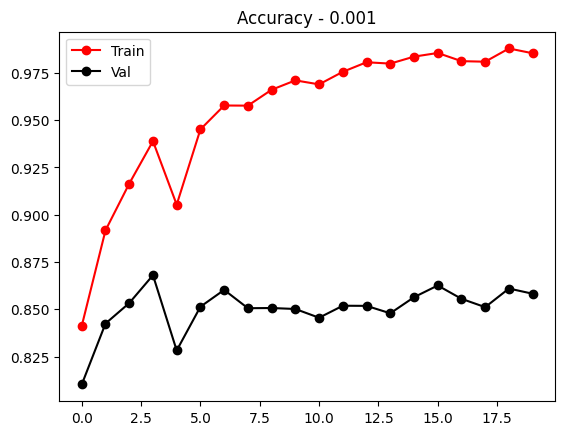

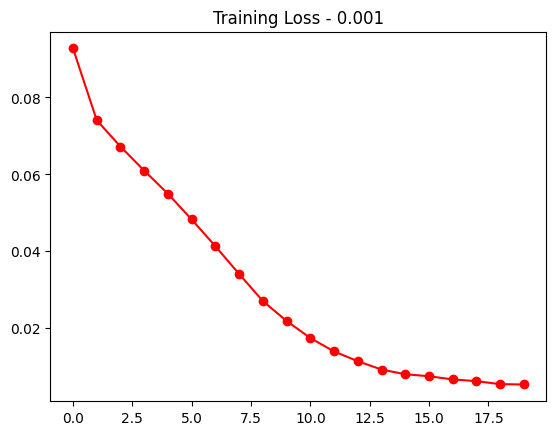

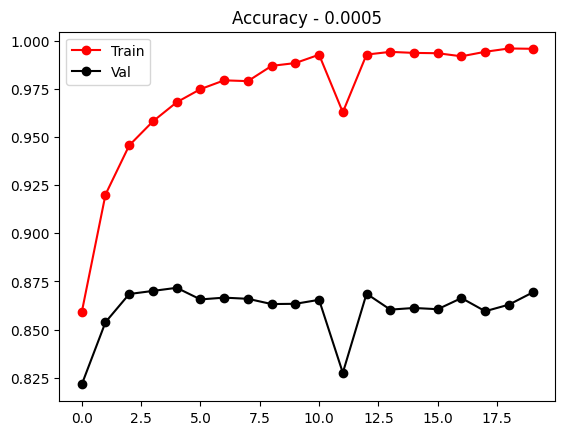

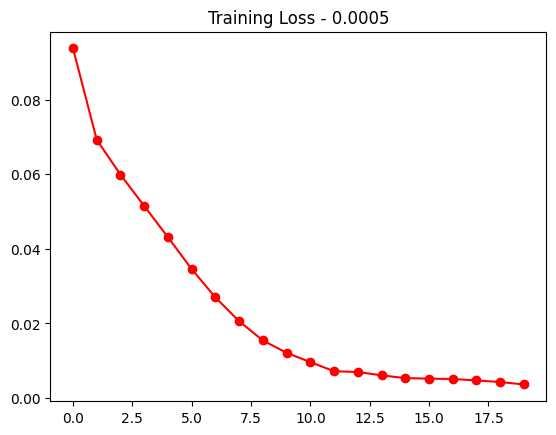

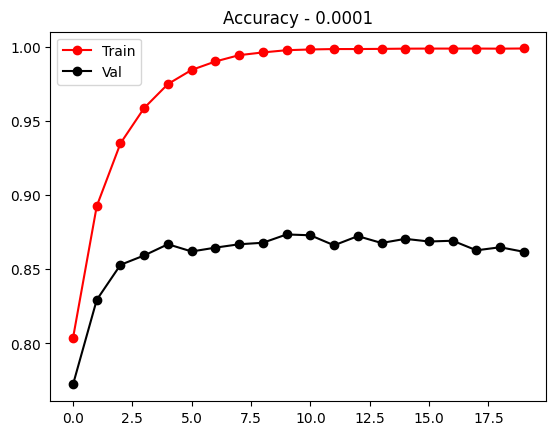

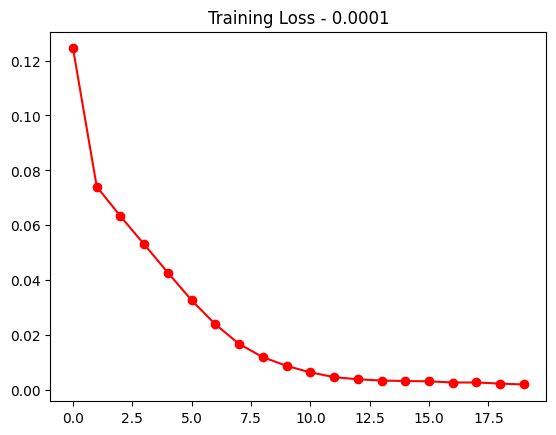

In [36]:
torch.cuda.empty_cache()
total_start = time.time()

train_loss_list = []
train_accuracy_list = []
val_accuracy_list = []
best_accuracy2 = 0.5
best_resnext101_finetune_list= []

for learn_rate in [0.001, 0.0005, 0.0001]:
    total_start = time.time()
    resnext101_default_weights = torchvision.models.ResNeXt101_64X4D_Weights.DEFAULT
    resnext101_pretrain = torchvision.models.resnext101_64x4d(weights=resnext101_default_weights, progress=False)
    resnext101_finetune = resnext101_pretrain
    num_ftrs = resnext101_finetune.fc.in_features
    resnext101_finetune.fc = torch.nn.Linear(num_ftrs, len(unique_traits))
    resnext101_finetune = resnext101_finetune.cuda()

    train_loss_list = []
    train_accuracy_list = []
    val_accuracy_list = []
    # best_accuracy2 = 0.5
    best_resnext101_finetune_list= []

    optim2 = torch.optim.Adam(resnext101_finetune.parameters(),lr = learn_rate)
    epochs = 20
    print(f"\n{epochs} epochs at Learning Rate =", learn_rate,"\n\n")
    for epoch in range(epochs):
        epoch_start = time.time()
        running_loss = 0.0
        resnext101_finetune.train()
        for imgs, labels in train_loader:
            imgs = imgs.cuda()
            labels = labels.cuda()
            optim2.zero_grad()
            with torch.set_grad_enabled(True):
                outputs = resnext101_finetune(imgs)
                loss = multi_label_loss(outputs,labels)
                loss.backward()
                optim2.step()
            running_loss += (loss.item()*imgs.size(0))
        curr_ep_loss2 = running_loss/len(train_loader.dataset)
        curr_train_aucs = get_score_model_auroc(resnext101_finetune, train_loader)
        curr_train_accuracy2 = average_auc(curr_train_aucs)
        curr_val_aucs = get_score_model_auroc(resnext101_finetune, val_loader)
        curr_val_accuracy2 = average_auc(curr_val_aucs)
        print('Ep {:d}: Train Loss = {:.5f}; Train Acc = {:.5f}'.format(epoch,curr_ep_loss2,curr_train_accuracy2))
        print('Val Acc = {:.5f}'.format(curr_val_accuracy2))
        train_loss_list.append(curr_ep_loss2)
        train_accuracy_list.append(curr_train_accuracy2)
        val_accuracy_list.append(curr_val_accuracy2)

        if curr_val_accuracy2 > best_accuracy2:
                best_accuracy2 = curr_val_accuracy2
                best_resnext101_finetune = copy.deepcopy(resnext101_finetune)
                torch.save(best_resnext101_finetune,f'./best_aug_resnext101_finetune2_{learn_rate}.pt')
        epoch_time = time.time()-epoch_start
        print('Epoch {:d} - time {:.1f}'.format(epoch,epoch_time))

    total_time = time.time()-total_start
    print('total training time {:.1f}'.format(total_time))

    plt.figure()
    plt.plot(train_accuracy_list,'ro-',val_accuracy_list,'ko-')
    plt.legend(['Train','Val'])
    plt.title(f'Accuracy - {learn_rate}')

    plt.figure()
    plt.plot(train_loss_list,'ro-')
    plt.title(f'Training Loss - {learn_rate}')

In [40]:
# without aug best 2 were 0.001 - 81.85 and 0.0001 - 81.3
top_models_resnet = [f"./{i}" for i in os.listdir("./") if "resnet" in i]
top_models_resnext = [f"./{i}" for i in os.listdir("./") if "resnext" in i]
top_models_efficient = [f"./{i}" for i in os.listdir("./") if "efficient" in i]
curr_best = 0
model_list = [top_models_resnet, top_models_resnext, top_models_efficient]
best_models = [None, None, None]
for i, top_models in enumerate(model_list):
    for model_path in top_models:
        top_model = torch.load(model_path)
        top_model.cuda().eval()
        test_results = get_score_model_auroc(top_model, test_loader)

        real_results = 0
        total_auc = 0
        print(f"### {model_path.replace('./','')} ###")
        for k, trait in enumerate(test_dataset.get_labels_name()):
            if not np.isnan(test_results[k]):
                # print(f"{trait} - total samples: {traits_dict[trait]} - {round(test_results[k],4)}")
                real_results += 1
                total_auc += test_results[k]
        print(f"{model_path.replace('./','')} - average auc ({real_results} traits): {total_auc/real_results}\n")
        if total_auc/real_results > curr_best:
            curr_best = total_auc/real_results
            real_best_model = copy.deepcopy(top_model)
            best_models[i] = real_best_model



### best_aug_resnet50_finetune2_0.0005.pt ###
best_aug_resnet50_finetune2_0.0005.pt - average auc (96 traits): 0.81935324042745

### best_aug_resnet50_finetune2_0.001.pt ###
best_aug_resnet50_finetune2_0.001.pt - average auc (96 traits): 0.8197179428648741

### best_aug_resnet50_finetune2_0.0001.pt ###
best_aug_resnet50_finetune2_0.0001.pt - average auc (96 traits): 0.8421421178676028

### best_aug_resnext101_finetune2_0.0005.pt ###
best_aug_resnext101_finetune2_0.0005.pt - average auc (96 traits): 0.8385061865842962

### best_aug_resnext101_finetune2_0.001.pt ###
best_aug_resnext101_finetune2_0.001.pt - average auc (96 traits): 0.833057076917408

### best_aug_resnext101_finetune2_0.0001.pt ###
best_aug_resnext101_finetune2_0.0001.pt - average auc (96 traits): 0.8453808937341555

### best_aug_efficientnetV2M_finetune2_0.0005.pt ###
best_aug_efficientnetV2M_finetune2_0.0005.pt - average auc (96 traits): 0.8337632629676645

### best_aug_efficientnetV2M_finetune2_0.001.pt ###
best_aug_eff

In [41]:
def predict_trait_single_image(image_path: str, model):
    model.cpu().eval()
    with torch.no_grad():
        image = Image.open(image_path)
        image = test_dataset.set_of_transforms(image)
        # image = image.cuda()
        image = image.unsqueeze(0)
        logit_predicted = model(image)
        results = torch.nn.functional.softmax(logit_predicted)
    return results.cpu().detach().numpy()

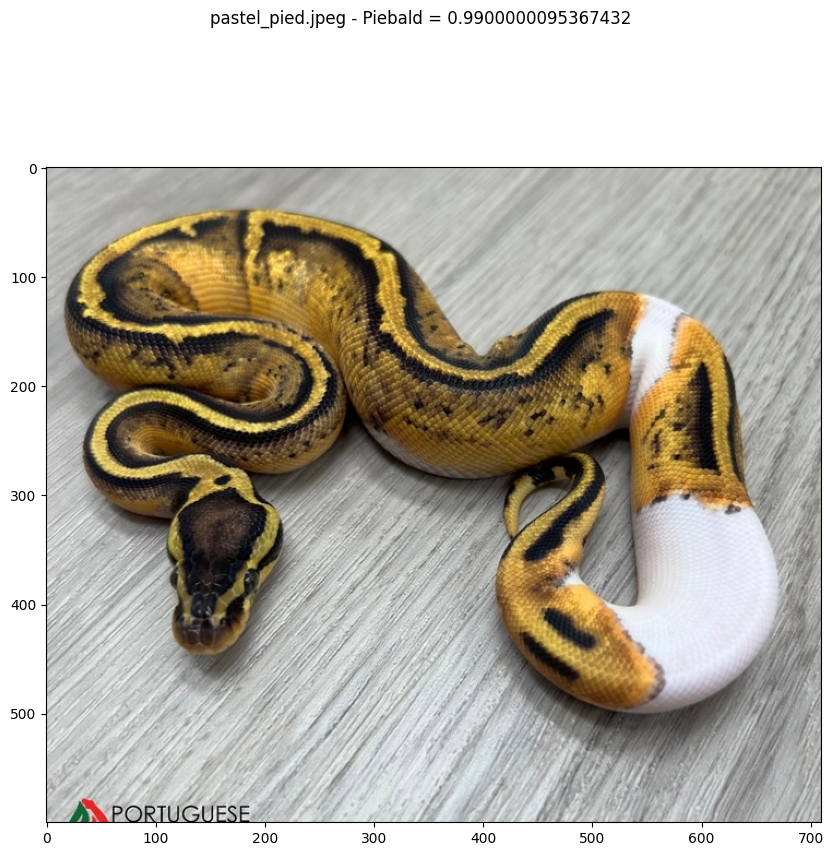

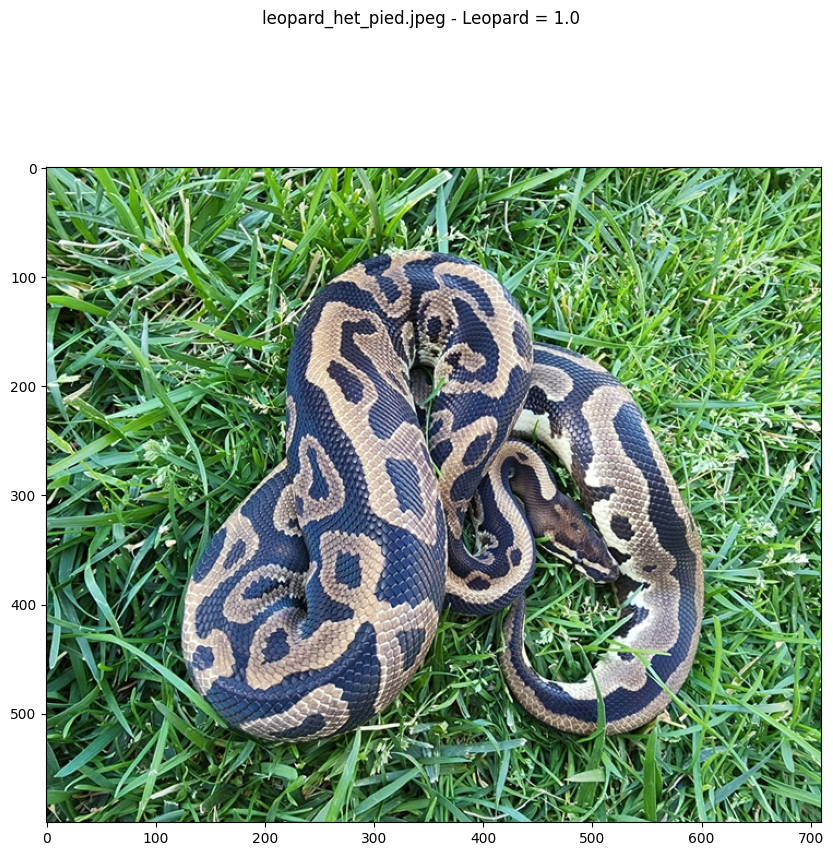

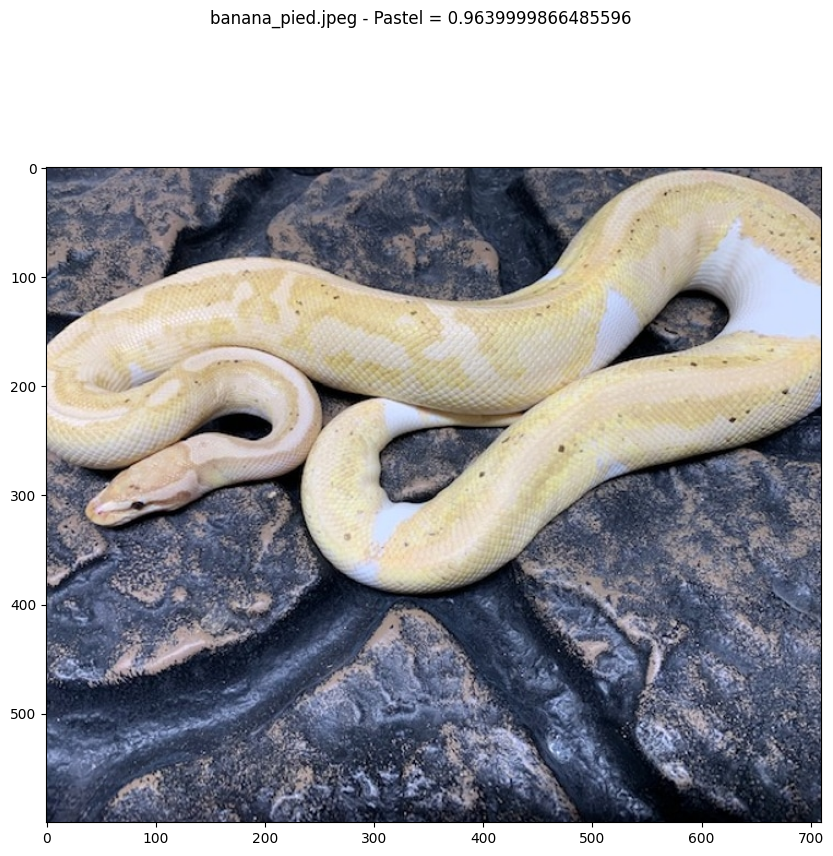

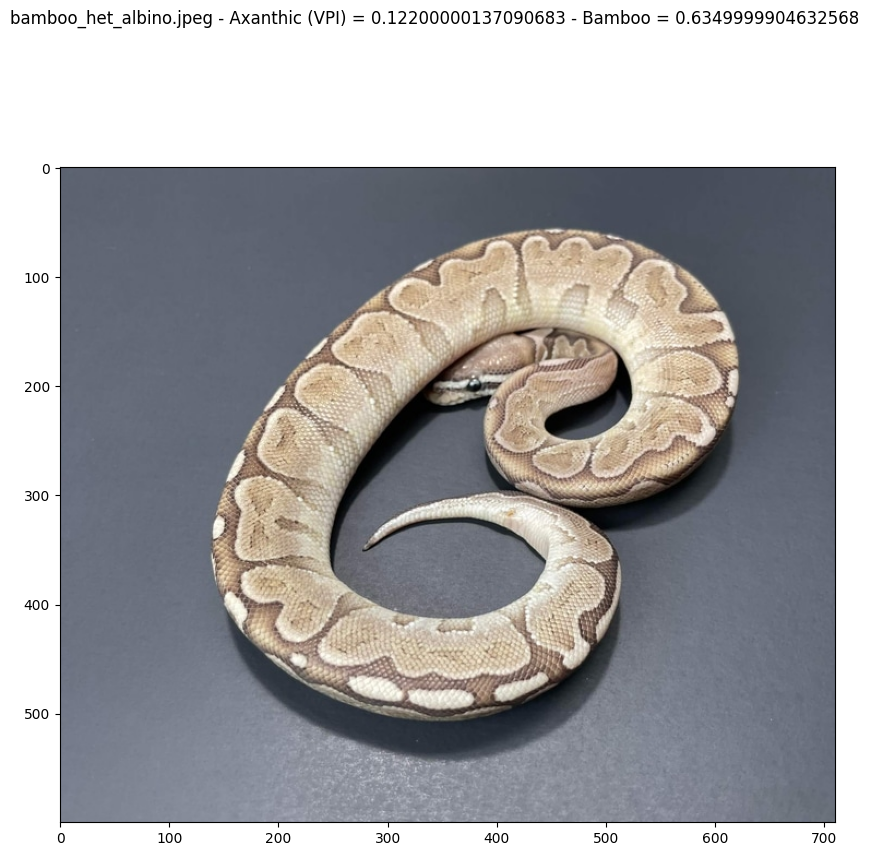

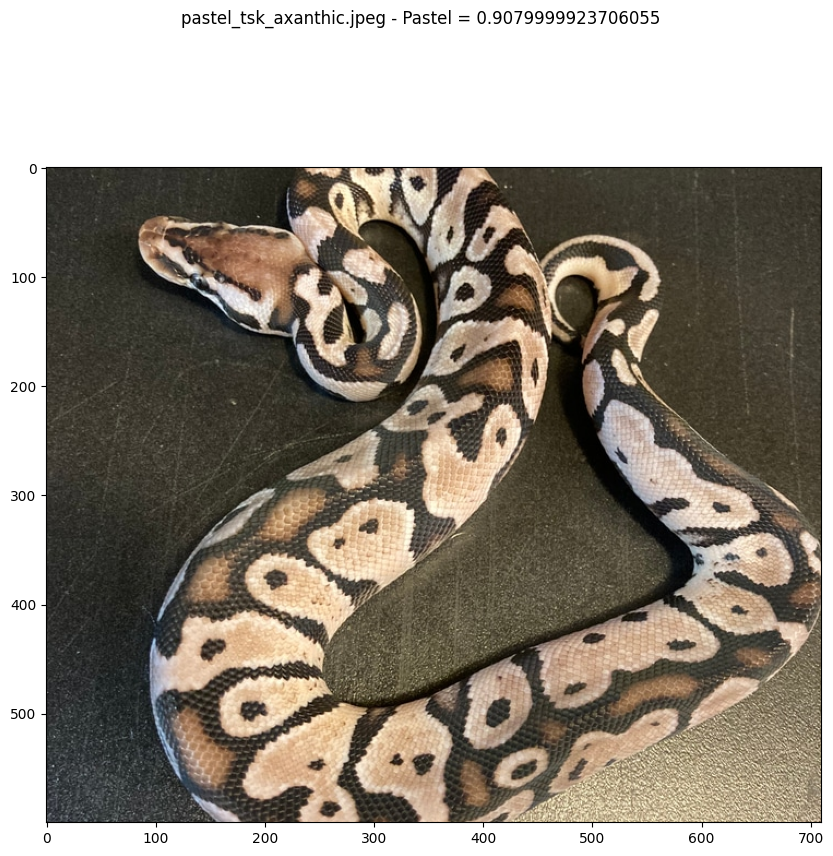

...

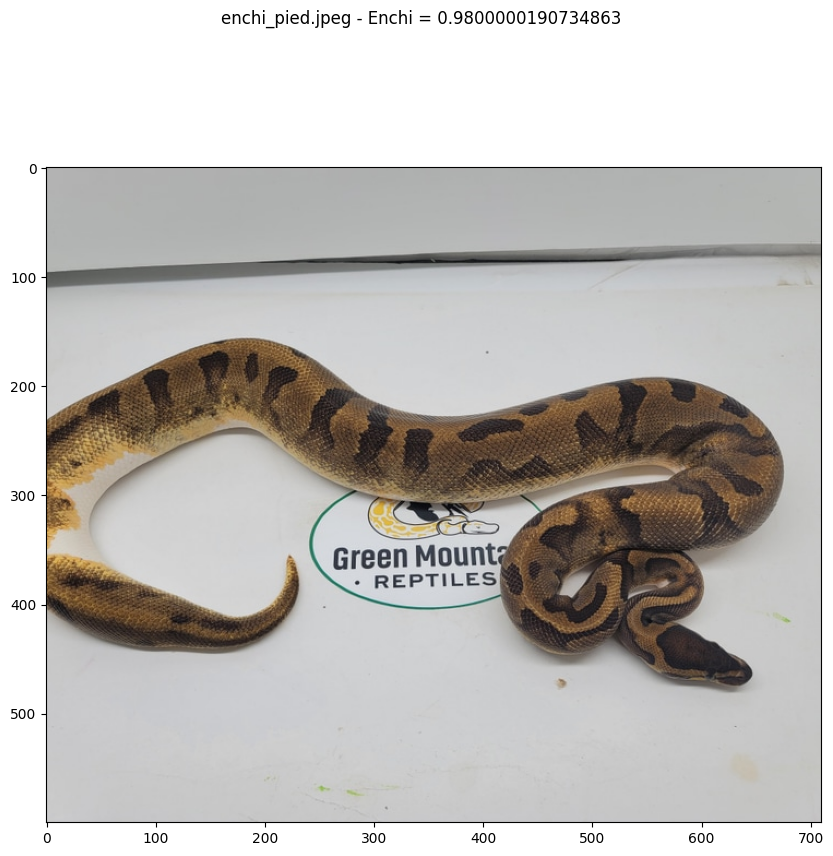

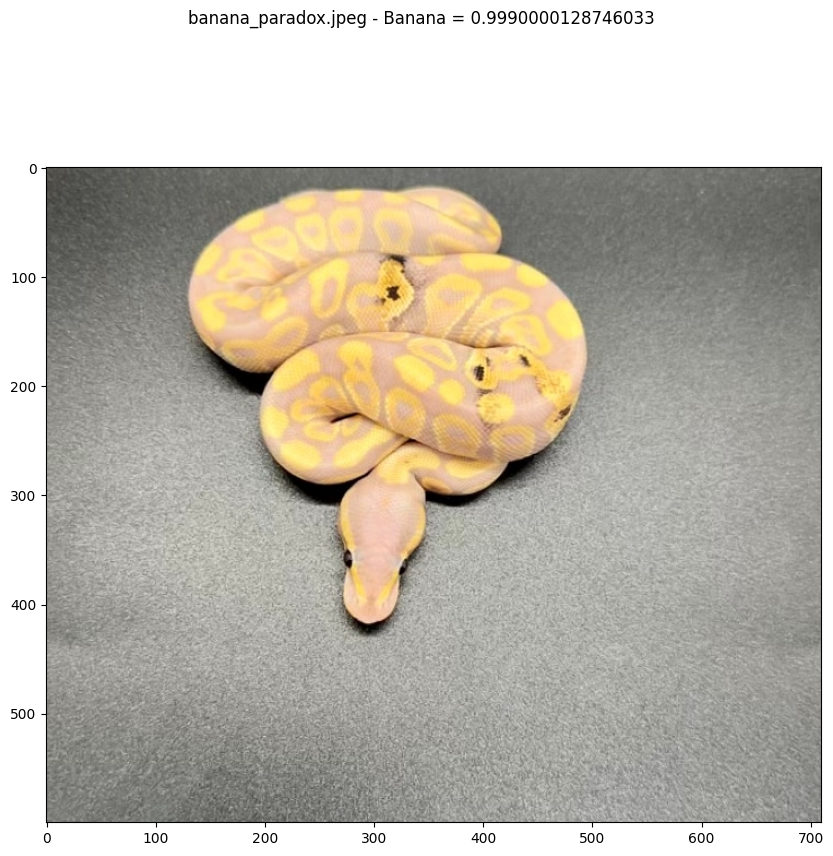

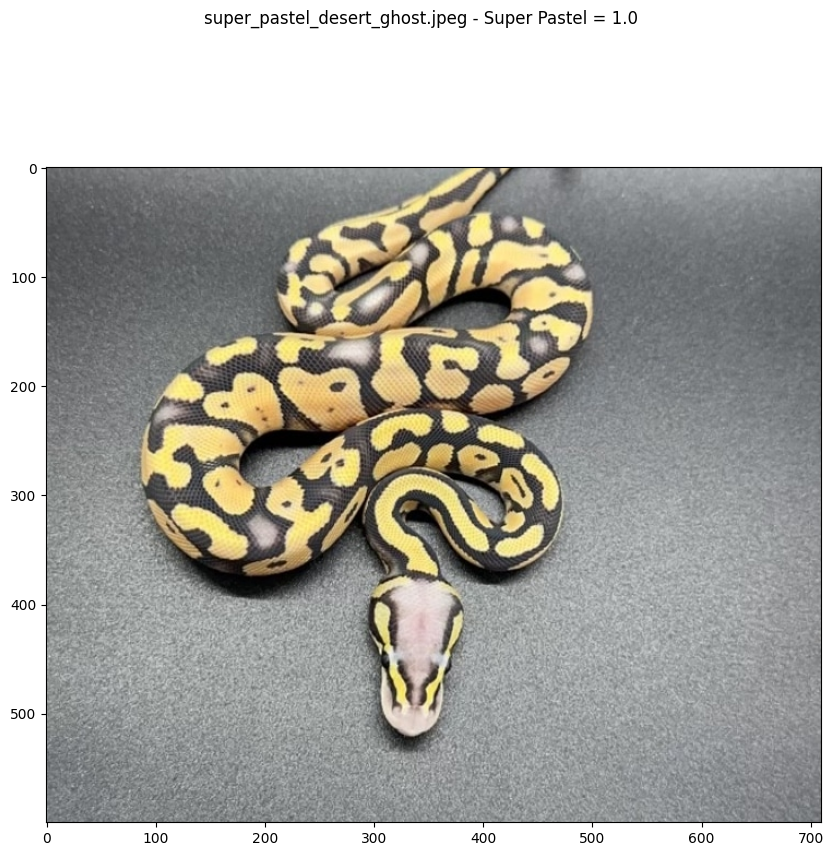

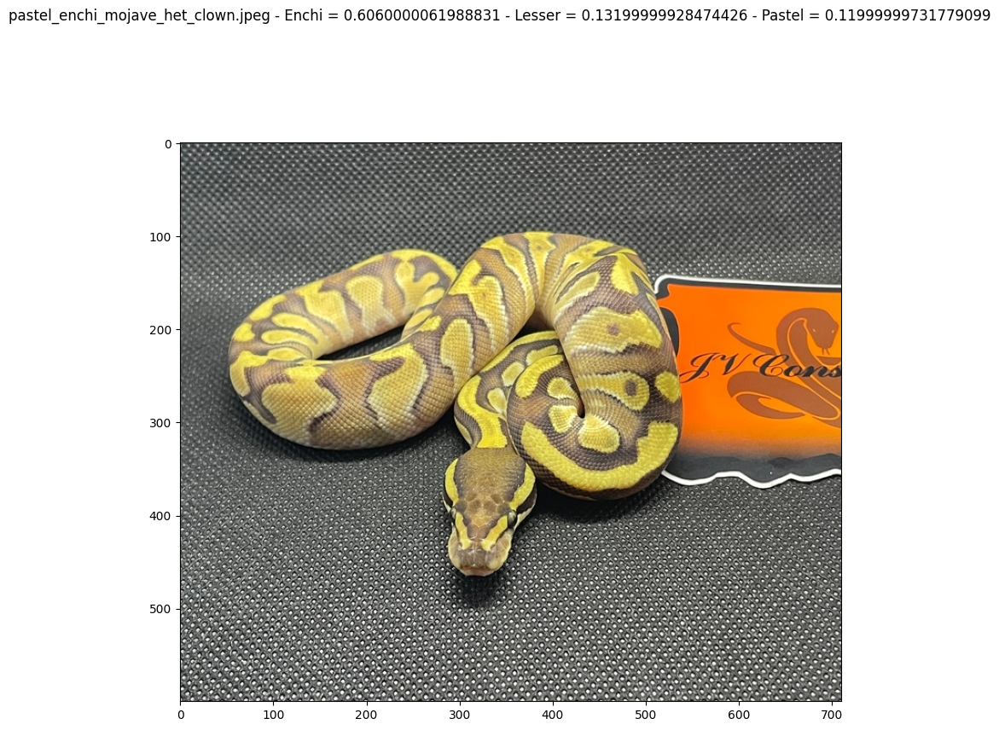

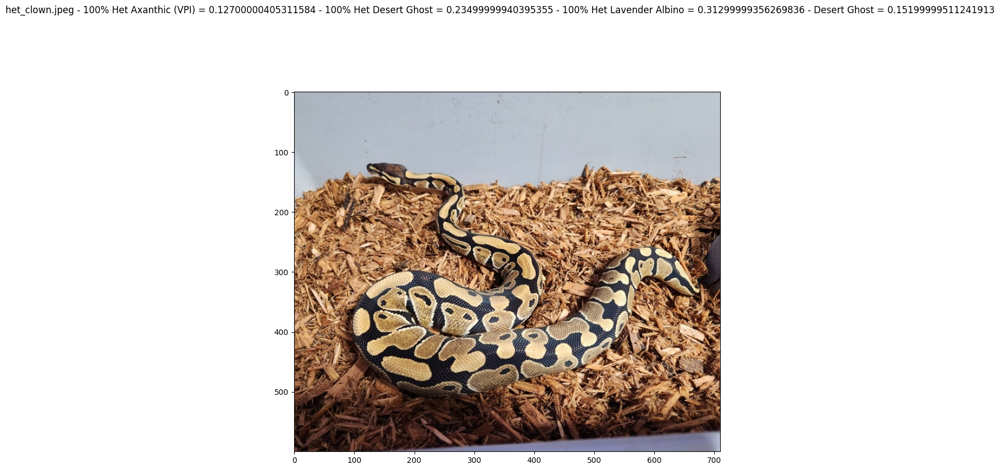

In [42]:
real_images = [f"./test_images/{i}" for i in os.listdir("./test_images/")]
for real_image in real_images:
    img_name = real_image.split("/")[-1]
    test_img_res = predict_trait_single_image(real_image, real_best_model)
    title_string = img_name
    for k, prob in enumerate(test_img_res[0]):
        if prob >= 0.1:
            title_string += f" - {unique_traits[k]} = {np.round(prob, 3)}"
    
    image = Image.open(real_image)
    fig = plt.figure(figsize=(10,10))
    plt.imshow(image)
    plt.suptitle(title_string)